
# Vocal separation


This notebook demonstrates a simple technique for separating vocals (and
other sporadic foreground signals) from accompanying instrumentation.

This is based on the "REPET-SIM" method of `Rafii and Pardo, 2012
<http://www.cs.northwestern.edu/~zra446/doc/Rafii-Pardo%20-%20Music-Voice%20Separation%20using%20the%20Similarity%20Matrix%20-%20ISMIR%202012.pdf>`_, but includes a couple of modifications and extensions:

    - FFT windows overlap by 1/4, instead of 1/2
    - Non-local filtering is converted into a soft mask by Wiener filtering.
      This is similar in spirit to the soft-masking method used by `Fitzgerald, 2012
      <http://arrow.dit.ie/cgi/viewcontent.cgi?article=1086&context=argcon>`_,
      but is a bit more numerically stable in practice.



In [1]:
# Code source: Brian McFee
# License: ISC

##################
# Standard imports
from __future__ import print_function
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import librosa
from IPython.display import Audio
import librosa.display
import sys
import scipy
from dtw import dtw
%matplotlib inline
try:
    sys.getwindowsversion()
except AttributeError:
    isWindows = False
else:
    isWindows = True

if isWindows:
    import win32api,win32process,win32con
    pid = win32api.GetCurrentProcessId()
    handle = win32api.OpenProcess(win32con.PROCESS_ALL_ACCESS, True, pid)
    win32process.SetPriorityClass(handle, win32process.HIGH_PRIORITY_CLASS)

Load an example with vocals.



In [2]:
#conda install av -c conda-forge
y, sr = librosa.load('Audio/Are You That Somebody.mp3')

# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

In [3]:
idx = slice(*librosa.time_to_frames([148, 182], sr=sr)) #slice it

In [4]:
# plt.figure(figsize=(12, 4))
# librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
#                          y_axis='log', x_axis='time', sr=sr)
# plt.title('5 Second Spectrum')
# plt.colorbar()
# plt.tight_layout()

In [5]:
# plt.figure(figsize=(12, 4))
# librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
#                          y_axis='log', x_axis='time', sr=sr)
# plt.title('Full Spectrum')
# plt.colorbar()
# plt.tight_layout()

The wiggly lines above are due to the vocal component.
Our goal is to separate them from the accompanying
instrumentation.




In [6]:
# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.

S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)

The raw filter output can be used as a mask,
but it sounds better if we use soft-masking.



In [7]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i, margin_v = 2, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_vocals = mask_v * S_full
S_instrumental = mask_i * S_full

Plot the same slice, but separated into its foreground and background



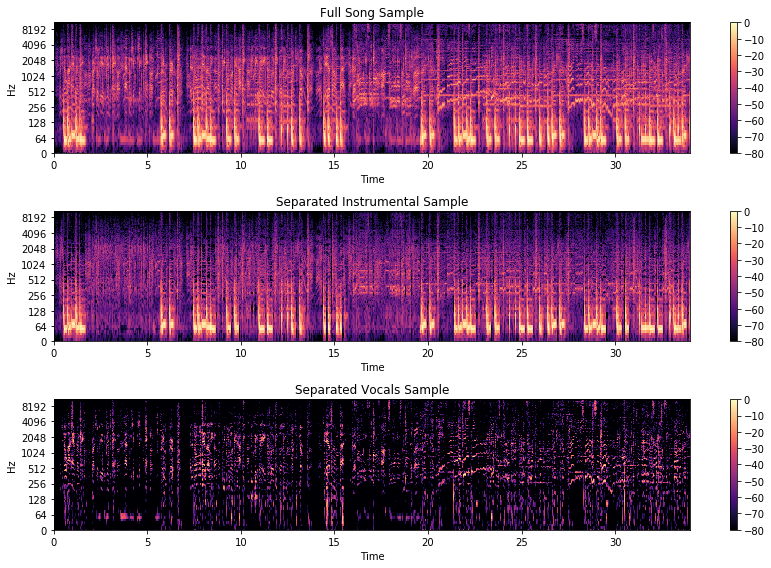

In [8]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Full Song Sample')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_instrumental[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Instrumental Sample')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_vocals[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Vocals Sample')
plt.colorbar()
plt.tight_layout()
plt.show()

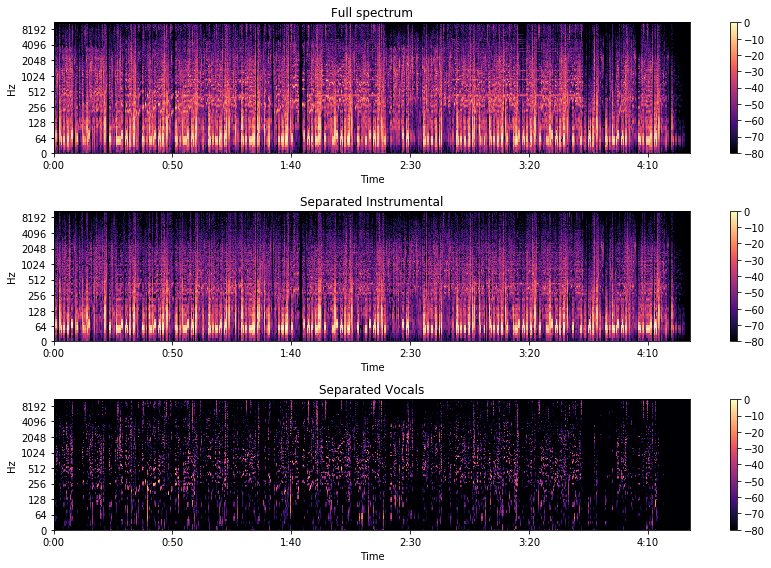

In [9]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_instrumental, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Instrumental')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_vocals, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Vocals')
plt.colorbar()
plt.tight_layout()
plt.show()

In [10]:
# Audio(data=librosa.istft(S_instrumental * phase), rate=sr)

In [11]:
librosa.output.write_wav('Audio/Aaliyah_Librosa_Instrumental.wav', y=librosa.istft((S_instrumental * phase)), sr=sr)

In [12]:
# Audio(data=librosa.istft(S_vocals * phase), rate=sr)

In [13]:
librosa.output.write_wav('Audio/Aaliyah_Librosa_Vocals.wav', y=librosa.istft((S_vocals * phase)), sr=sr)

In [14]:
Audio(data=librosa.istft((S_full * phase)[:, idx]), rate=sr) 

In [15]:
librosa.output.write_wav('Audio/Aaliyah_Sample.wav', y=librosa.istft((S_full * phase)[:, idx]), sr=sr)

In [16]:
Audio(data=librosa.istft((S_instrumental * phase)[:, idx]), rate=sr)

In [17]:
librosa.output.write_wav('Audio/Aaliyah_Librosa_Sample_Instrumental.wav', y=librosa.istft((S_instrumental * phase)[:, idx]), sr=sr)

In [18]:
Audio(data=librosa.istft((S_vocals * phase)[:, idx]), rate=sr)

In [19]:
librosa.output.write_wav('Audio/Aaliyah_Librosa_Sample_Vocals.wav', y=librosa.istft((S_vocals * phase)[:, idx]), sr=sr)

In [20]:
yI, srI = librosa.load('Audio/Are You That Somebody (Instrumental).mp3')
yA, srA = librosa.load('Audio/Are You That Somebody (Acapella).mp3')

S_I, phaseI = librosa.magphase(librosa.stft(yI))
S_A, phaseA = librosa.magphase(librosa.stft(yA))

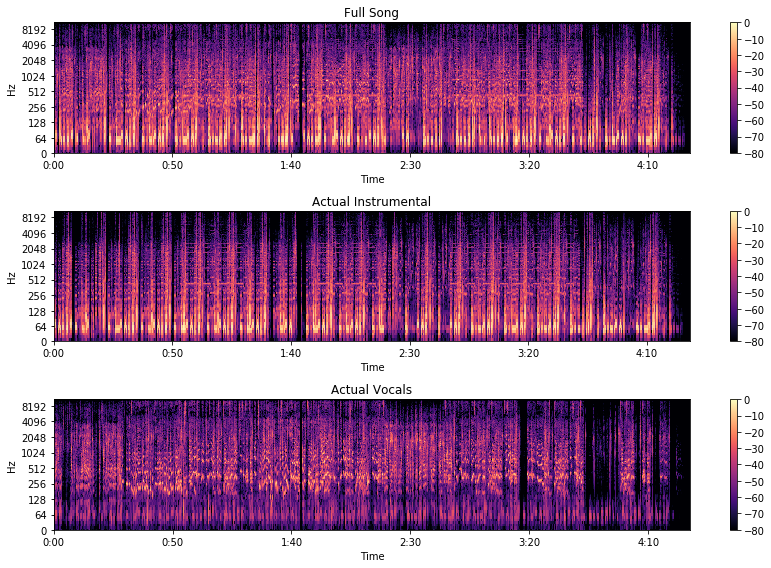

In [21]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Full Song')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_I, ref=np.max),
                         y_axis='log', x_axis='time', sr=srI)
plt.title('Actual Instrumental')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_A, ref=np.max),
                         y_axis='log', x_axis='time', sr=srA)
plt.title('Actual Vocals')
plt.colorbar()
plt.tight_layout()
plt.show()

In [22]:
#alignment with separate audio files
idxI = slice(*librosa.time_to_frames([147.6, 181.6], sr=srI)) #actual instrumental is a bit ahead, check sample viz
idxA = slice(*librosa.time_to_frames([148.2, 182.2], sr=srA)) #actual acapella is a bit behind, check sample viz

In [23]:
# Audio(data=librosa.istft(S_I * phaseI), rate=srI)

In [24]:
# Audio(data=librosa.istft(S_A * phaseA), rate=srA)

In [25]:
Audio(data=librosa.istft((S_full * phase)[:, idx]), rate=sr) 

In [26]:
Audio(data=librosa.istft((S_I * phaseI)[:, idxI]), rate=srI)

In [27]:
librosa.output.write_wav('Audio/Aaliyah_Actual_Sample_Instrumental.wav', y=librosa.istft((S_I * phaseI)[:, idxI]), sr=srI)

In [28]:
Audio(data=librosa.istft((S_A * phaseA)[:, idxA]), rate=srA)

In [29]:
librosa.output.write_wav('Audio/Aaliyah_Actual_Sample_Vocals.wav', y=librosa.istft((S_A * phaseA)[:, idxA]), sr=srA)

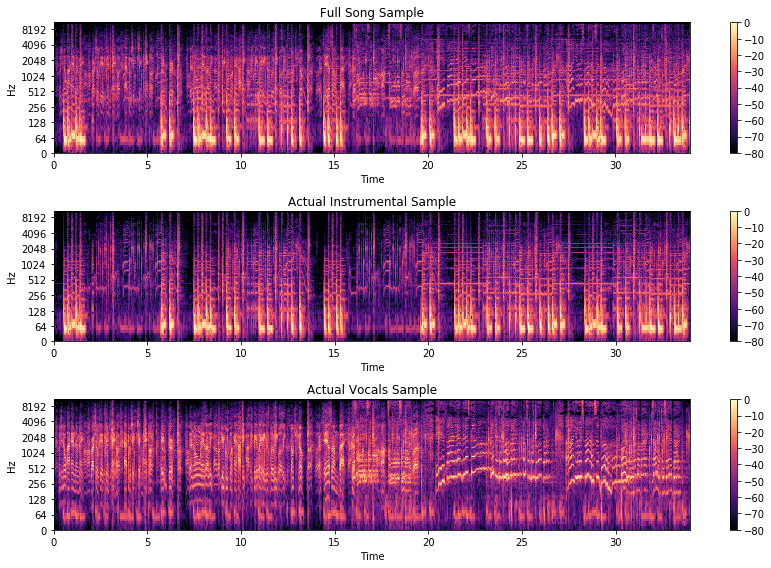

In [30]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Full Song Sample')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_I[:, idxI], ref=np.max),
                         y_axis='log', x_axis='time', sr=srI)
plt.title('Actual Instrumental Sample')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_A[:, idxA], ref=np.max),
                         y_axis='log', x_axis='time', sr=srA)
plt.title('Actual Vocals Sample')
plt.colorbar()
plt.tight_layout()
plt.show()

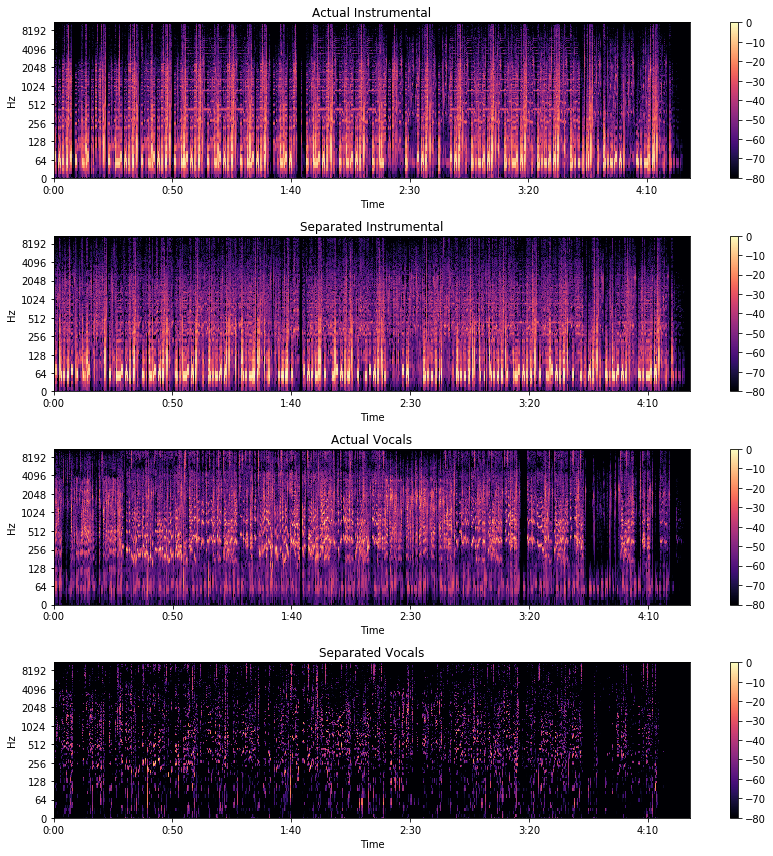

In [31]:
plt.figure(figsize=(12, 12))
plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_I, ref=np.max),
                         y_axis='log', x_axis='time', sr=srI)
plt.title('Actual Instrumental')
plt.colorbar()
plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_instrumental, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Instrumental')
plt.colorbar()
plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_A, ref=np.max),
                         y_axis='log', x_axis='time', sr=srA)
plt.title('Actual Vocals')
plt.colorbar()
plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(S_vocals, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Vocals')
plt.colorbar()
plt.tight_layout()
plt.show()

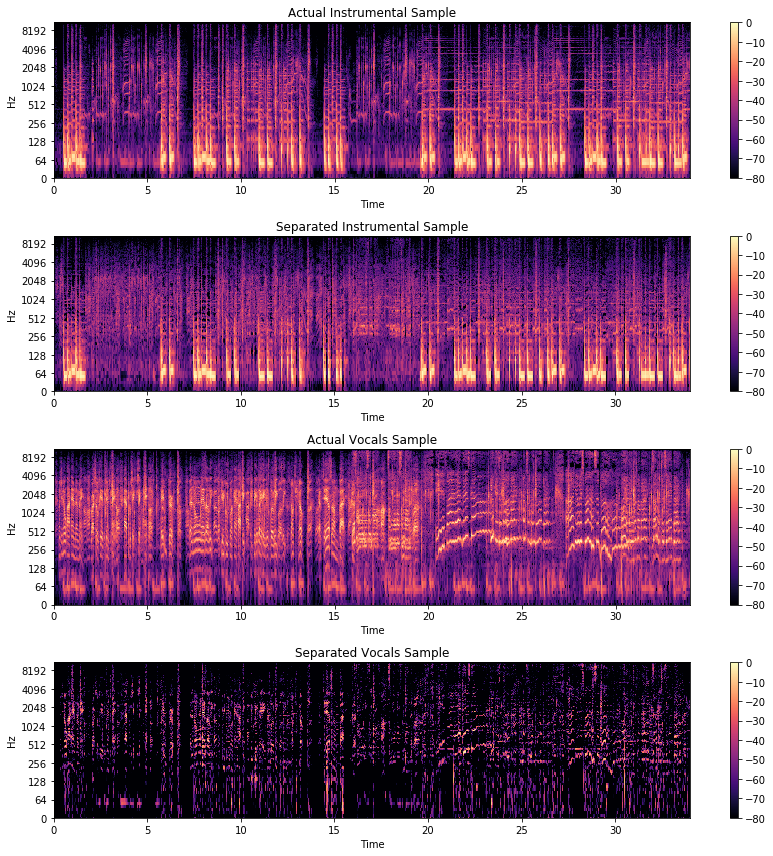

In [32]:
plt.figure(figsize=(12, 12))
plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_I[:, idxI], ref=np.max),
                         y_axis='log', x_axis='time', sr=srI) #aligned from earlier
plt.title('Actual Instrumental Sample')
plt.colorbar()
plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_instrumental[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Instrumental Sample')
plt.colorbar()
plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_A[:, idxA], ref=np.max),
                         y_axis='log', x_axis='time', sr=srA) #aligned from earlier
plt.title('Actual Vocals Sample')
plt.colorbar()
plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(S_vocals[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Separated Vocals Sample')
plt.colorbar()
plt.tight_layout()
plt.show()

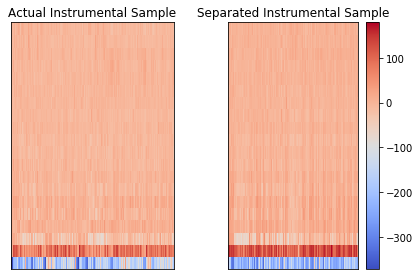

In [33]:
#Showing multiple plots using subplot
plt.subplot(1, 2, 1) 
mfccI = librosa.feature.mfcc(librosa.istft((S_I * phaseI)[:, idxI]), srI)   #Computing MFCC values
librosa.display.specshow(mfccI)
plt.title('Actual Instrumental Sample')
plt.subplot(1, 2, 2)
mfcc_I = librosa.feature.mfcc(librosa.istft((S_instrumental * phase)[:, idx]), sr)
librosa.display.specshow(mfcc_I)
plt.title('Separated Instrumental Sample')
plt.colorbar()
plt.tight_layout()
plt.show()

In [34]:
distI, costI, accI, pathI = dtw(mfccI.T, mfcc_I.T, dist=lambda x, y: norm(x - y, ord=1))
print("The normalized distance between instrumentals: ",distI)   # 0 for similar audios 

The normalized distance between instrumentals:  135.49372983430553


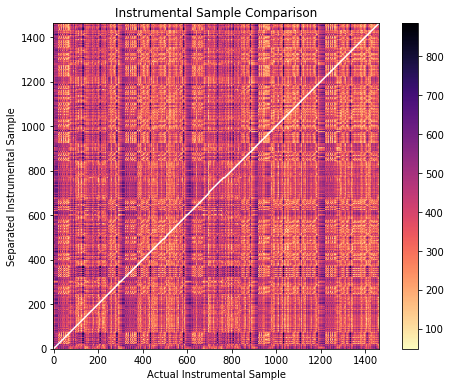

In [35]:
plt.figure(figsize=(8, 6))
plt.imshow(costI.T, origin='lower', cmap=plt.get_cmap('magma_r'), interpolation='nearest')
plt.plot(pathI[0], pathI[1], 'w')   #creating plot for DTW, note the 45 angle from previous alignment
plt.title('Instrumental Sample Comparison')
plt.xlabel("Actual Instrumental Sample")
plt.ylabel("Separated Instrumental Sample")
plt.colorbar()
plt.show()

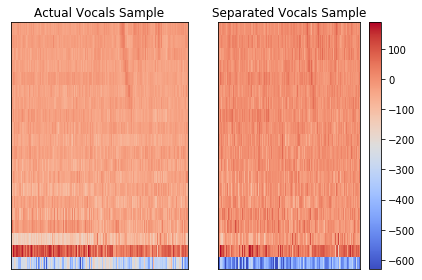

In [36]:
#Showing multiple plots using subplot
plt.subplot(1, 2, 1) 
mfccA = librosa.feature.mfcc(librosa.istft((S_A * phaseA)[:, idxA]), srA)   #Computing MFCC values
librosa.display.specshow(mfccA)
plt.title('Actual Vocals Sample')
plt.subplot(1, 2, 2)
mfcc_A = librosa.feature.mfcc(librosa.istft((S_vocals * phase)[:, idx]), sr)
librosa.display.specshow(mfcc_A)
plt.title('Separated Vocals Sample')
plt.colorbar()
plt.tight_layout()
plt.show()

In [37]:
distA, costA, accA, pathA = dtw(mfccA.T, mfcc_A.T, dist=lambda x, y: norm(x - y, ord=1))
print("The normalized distance between acapellas: ",distA)   # 0 for similar audios 

The normalized distance between acapellas:  283.2831056047402


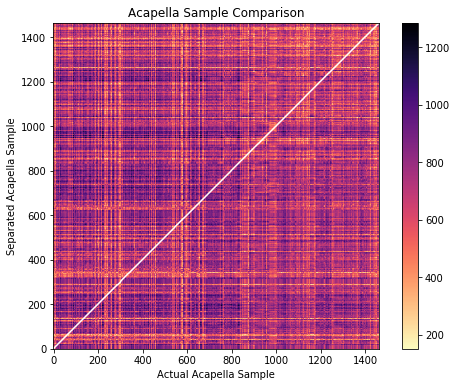

In [38]:
plt.figure(figsize=(8, 6))
plt.imshow(costA.T, origin='lower', cmap=plt.get_cmap('magma_r'), interpolation='nearest')
plt.plot(pathA[0], pathA[1], 'w')   #creating plot for DTW, note the 45 angle from previous alignment
plt.title('Acapella Sample Comparison')
plt.xlabel("Actual Acapella Sample")
plt.ylabel("Separated Acapella Sample")
plt.colorbar()
plt.show()